In [1]:
import contextily as cx
import folium
import pandas as pd
import geopandas as gpd
from pathlib import Path
from shapely.geometry import Point

In [4]:
file = Path().cwd() / 'accidents.csv'

In [10]:
csv_file = pd.read_csv('accidents.csv',parse_dates=['Date'], encoding_errors='ignore')

csv_file['Day'] = csv_file['Day'].apply(lambda x: 
                                        x.split()[1])

csv_file['Severity'] = csv_file['Severity'].apply(lambda x: 
                                                  x.split()[1])

csv_file['Road_cond'] = csv_file['Road_cond'].fillna('100 nothing')

csv_file['Road_cond'] = csv_file['Road_cond'].astype(str).apply(lambda x: 
                                                                x.split()[1])

csv_file['Visibility'] = csv_file['Visibility'].apply(lambda x: ' '
                                                      .join(x.split()[1:]))

csv_file['Cross_fac'] = csv_file['Cross_fac'].apply(lambda x: ' '
                                                    .join(x.split()[1:]))

csv_file['Weather'] = csv_file['Weather'].apply(lambda x: ' '
                                                .join(x.split()[1:]))

csv_file['SpCond'] = csv_file['SpCond'].astype(str).apply(lambda x: ' '
                                                          .join(x.split()[1:]))

csv_file['Carr_haz'] = csv_file['Carr_haz'].astype(str).apply(lambda x: ' '
                                                              .join(x.split()[1:]))

csv_file['ReportedAt'] = csv_file['ReportedAt'].astype(str).apply(lambda x: ' '
                                                                  .join(x.split()[1:]))

In [11]:
csv_file.head()

,Date,Police_ref,Easting,Northing,Veh_ref,Cas_ref,Severity,Road_cond,Visibility,Casualties,...,Cross_fac,Weather,SpCond,Carr_haz,Day,DfTSp,Location,Local_Auth,ReportedAt,Parish
0,2017-01-01,17146457,545741,310887,NaN,NaN,Slight,Wet/Damp,Darkness: street lights present and lit,1,...,None within 50m,Fine without high winds,None,None,Sunday,NaN,CRAB MARSH,E07000010,Yes,253
1,2017-01-02,17146536,529059,286852,NaN,NaN,Slight,Frost/Ice,Daylight,1,...,None within 50m,Fine without high winds,None,None,Monday,NaN,STOCKING FEN ROAD 460 METRES WEST OF JUNCTION ...,E07000011,Yes,184
2,2017-01-02,17146662,540027,314219,NaN,NaN,Serious,Frost/Ice,Daylight,1,...,None within 50m,Fine without high winds,None,None,Monday,NaN,OUTSIDE PECKS FARM CROSS DROVE,E07000010,Yes,227
3,2017-01-02,17146686,546900,290440,NaN,NaN,Slight,Frost/Ice,Daylight,1,...,None within 50m,Fine without high winds,None,None,Monday,NaN,OUTSIDE PLANTATION FARM WIMBLINGTON ROAD B1093,E07000010,Yes,250
4,2017-01-02,17146697,529780,270124,NaN,NaN,Slight,Frost/Ice,Darkness: street lights present and lit,1,...,None within 50m,Fine without high winds,None,None,Monday,NaN,38 MARSH LANE UNSPECIFIED ROAD OR LOCATION,E07000011,Yes,115


In [139]:
csv_file.drop(columns=['Police_ref', 'Veh_ref', 'Cas_ref'], inplace=True)

In [12]:
csv_file.to_csv('cleaned_data.csv')

In [13]:
geo = gpd.read_file('cleaned_data.csv')

In [14]:
geometry = gpd.points_from_xy(csv_file.Easting, csv_file.Northing, crs="EPSG:27700")

In [15]:
gdf = gpd.GeoDataFrame(
    csv_file.drop(['Easting', 'Northing'], axis=1),
    crs='epsg:27700',
    geometry=[Point(xy) for xy in zip(csv_file.Easting, csv_file.Northing)])

<AxesSubplot:>

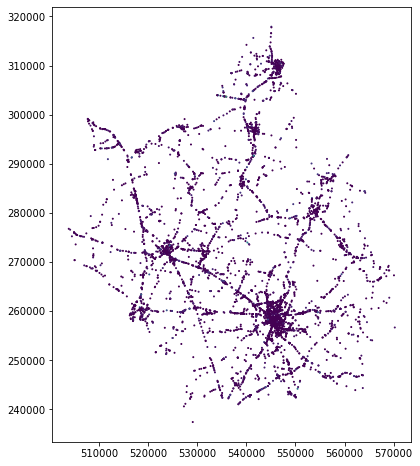

In [16]:
gdf.plot(column='Casualties', markersize=1, figsize=(12,8))

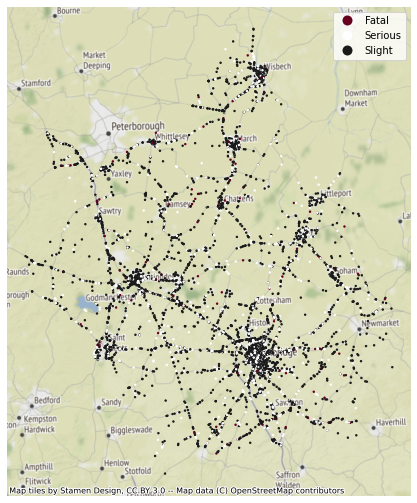

In [17]:
ax = gdf.plot(column='Severity', figsize=(9, 9),cmap='RdGy', markersize=2, legend=True)
ax.set_axis_off()
cx.add_basemap(ax, crs=gdf.crs)

In [18]:
gdf.to_crs(epsg=4326, inplace=True)

In [19]:
map = folium.Map(location = [52.4,0.1], 
                 tiles = "OpenStreetMap", 
                 zoom_start = 10)

In [21]:
geo_list = [[point.xy[1][0], point.xy[0][0]] for point in gdf.geometry ]



for i, coordinates in enumerate(geo_list):
    
    if gdf.Severity[i] == "Slight":
        type_color = "green"
    if gdf.Severity[i] == "Serious":
        type_color = "blue"
    if gdf.Severity[i] == "Fatal":
        type_color = "red"
    


    # Place the markers with the popup labels and data
    map.add_child(folium.CircleMarker(location = coordinates,
                            radius=2,
                            popup =
                            "Date: " + str(gdf.Date[i]) + '<br>' +
                            "Weather: " + str(gdf.Weather[i]) + '<br>' +
                            "Day: " + str(gdf.Day[i]) + '<br>'
                            "Casualties: " + str(gdf.Casualties[i]),
                            color = "%s" % type_color,
                            fill_color="%s" % type_color,
                            fill_opacity=0.5))


In [241]:
map